In [398]:
import nltk
import numpy as np
import pandas as pd
import igraph as ig
import leidenalg as la
from collections import Counter
from functools import reduce

from wordcloud import WordCloud, STOPWORDS
import SN_help
import importlib
importlib.reload(SN_help) # reload package
from SN_help import plot_3d_graph, plot_2d_graph, plot_3d_communities, get_TFIDF ,\
                    add_numerical_attribute, Happy_Hedonometer, plot_hap_dist_for_attr, \
                    list_add, plot_mean_dist_for_attr_x, plot_mean_dist_for_attr_y, boxplot_for_perumtation,\
                    cloudplot_for_perumtation, plot_hap_dist_for_community, plot_mean_dist_for_community_x,\
                    plot_mean_dist_for_community_y, boxplot_for_perumtation_community, get_attr_hap, get_comm_hap,\
                    ttest_ind_fun

## Communities

### Communities detection

#### Communities detection methods from `iGraph`

1. Community structure based on **the betweenness of the edges in the network**.

    > The idea is that the betweenness of the edges connecting two communities is typically high, as many of the shortest paths between nodes in separate communities go through them. So we gradually remove the edge with the highest betweenness and recalculate the betweennesses after every removal. This way sooner or later the network falls of to separate components. The result of the clustering will be represented by a dendrogram.
    
2. Community structure based on **the greedy optimization of modularity**.

    > This algorithm merges individual nodes into communities in a way that greedily maximizes the modularity score of the graph. It can be proven that if no merge can increase the current modularity score, the algorithm can be stopped since no further increase can be achieved. It runs almost in linear time on sparse graphs.
    
3. Community structure based on **the Infomap method of Martin Rosvall and Carl T. Bergstrom**.

    > The algorithm defines a attribute called `codelength`.
    
4. Community structure based on **the label propagation method of Raghavan et al**.

5. Community structure based on **Newman's leading eigenvector method**.

6. Community structure based on **the Leiden algorithm of Traag, van Eck & Waltman**.

7. Community structure based on **the multilevel algorithm of Blondel et al**.

    > It's a bottom-up algorithm, runs almost in linear time on sparse graphs.
    
8. Community structure based on **calculating the optimal modularity score of the graph**.

    > Unlikely to work for graphs larger than a few (less than a hundred) vertices, For a gigant network, use others instead.

9. Community structure based on **the spinglass community detection method of Reichardt & Bornholdt**.

10. Community structure based on **based on random walks**.

    > The basic idea of the algorithm is that short random walks tend to stay in the same community

11. Community structure based on **Louvain Algorithm**.
    
*some methods can return vertex dendrogram. and we only detect the communities inside the giant component GCC in our movie network.

In [174]:
# load checkpoint
mg = ig.Graph.Read_Pickle('./netflix/network/netflix.movie.ig.pickle')
gcc = mg.connected_components().giant()
print(gcc.summary(), '\n')
com_summary = pd.DataFrame(columns=['Cluster', 'Modularity', 'Top10_size'])

# bt_dendrogram = gcc.community_edge_betweenness(directed=True) ## too slow
# bt_clustering = bt_dendrogram.as_clustering() 
# gcc.vs['bt_clustering'] = bt_clustering.membership
# com_summary.loc['Edge Betweenness'] = [bt_clustering._len, bt_clustering.modularity, [i[1] for i in Counter(bt_clustering.membership).most_common(10)] ]

fg_dendrogram = gcc.community_fastgreedy()
fg_clustering = fg_dendrogram.as_clustering() 
gcc.vs['fg_clustering'] = fg_clustering.membership
com_summary.loc['Fast Greedy'] = [fg_clustering._len, fg_clustering.modularity, [i[1] for i in Counter(fg_clustering.membership).most_common(10)] ]

im_clustering = gcc.community_infomap()
gcc.vs['im_clustering'] = im_clustering.membership
com_summary.loc['InfoMap'] = [im_clustering._len, im_clustering.modularity, [i[1] for i in Counter(im_clustering.membership).most_common(10)] ]

ml_clustering = gcc.community_label_propagation()
gcc.vs['ml_clustering'] = ml_clustering.membership
com_summary.loc['Label Propagation'] = [ml_clustering._len, ml_clustering.modularity, [i[1] for i in Counter(ml_clustering.membership).most_common(10)] ]

try:
    ev_clustering = gcc.community_leading_eigenvector() # hard to converge, not stable, so catch the error and re do it.
except :
    ev_clustering = gcc.community_leading_eigenvector()
gcc.vs['ev_clustering'] = ev_clustering.membership
com_summary.loc['Leading Eigenvector'] = [ev_clustering._len, ev_clustering.modularity, [i[1] for i in Counter(ev_clustering.membership).most_common(10)] ]

ld_clustering = gcc.community_leiden(objective_function="modularity")
gcc.vs['ld_clustering'] = ld_clustering.membership
com_summary.loc['Leiden Algorithm'] = [ld_clustering._len, ld_clustering.modularity, [i[1] for i in Counter(ld_clustering.membership).most_common(10)] ]

lp_clustering = gcc.community_multilevel()
gcc.vs['lp_clustering'] = lp_clustering.membership
com_summary.loc['Multilevel Algorithm'] = [lp_clustering._len, lp_clustering.modularity, [i[1] for i in Counter(lp_clustering.membership).most_common(10)] ]

sl_clustering = gcc.community_spinglass()
gcc.vs['sl_clustering'] = sl_clustering.membership
com_summary.loc['Spinglass'] = [sl_clustering._len, sl_clustering.modularity, [i[1] for i in Counter(sl_clustering.membership).most_common(10)] ]

rw_clustering = gcc.community_walktrap().as_clustering() 
gcc.vs['rw_clustering'] = rw_clustering.membership
com_summary.loc['Random walks'] = [rw_clustering._len, rw_clustering.modularity, [i[1] for i in Counter(rw_clustering.membership).most_common(10)] ]

com_summary

IGRAPH U-W- 1923 8346 -- 
+ attr: averageRating (v), boxOffice (v), bt (v), budget (v), cn (v), country (v), description (v), dg (v), ev (v), genres (v), numVotes (v), primaryTitle (v), runtimeMinutes (v), startYear (v), tconst (v), weight (e) 



,Cluster,Modularity,Top10_size
Fast Greedy,34,0.670547,"[402, 334, 289, 249, 225, 83, 39, 37, 37, 30]"
InfoMap,188,0.649398,"[28, 27, 27, 26, 26, 26, 25, 25, 24, 23]"
Label Propagation,150,0.662625,"[226, 68, 43, 38, 35, 35, 30, 27, 27, 26]"
Leading Eigenvector,82,0.646061,"[197, 188, 170, 157, 139, 135, 128, 112, 71, 71]"
Leiden Algorithm,28,0.729446,"[175, 166, 155, 133, 121, 116, 110, 95, 92, 89]"
Multilevel Algorithm,24,0.725612,"[211, 170, 164, 132, 124, 112, 91, 87, 87, 87]"
Spinglass,24,0.726092,"[186, 148, 145, 145, 141, 104, 99, 96, 95, 90]"
Random walks,177,0.652222,"[397, 243, 142, 70, 55, 47, 34, 31, 30, 22]"


#### Community detections from package `leidenalg`

In [175]:
mg = ig.Graph.Read_Pickle('./netflix/network/netflix.movie.ig.pickle')
gcc = mg.connected_components().giant()
print(gcc.summary(), '\n')

# ref: https://leidenalg.readthedocs.io/en/stable/install.html
# this package have more free parmeter to tuning our communities, like fixed nodes, Maximum community size
p0 = la.find_partition(gcc, la.ModularityVertexPartition)
p1 = la.find_partition(gcc, la.RBConfigurationVertexPartition)
p2 = la.find_partition(gcc, la.RBERVertexPartition)
p3 = la.find_partition(gcc, la.CPMVertexPartition)
p4 = la.find_partition(gcc, la.SignificanceVertexPartition)
p5 = la.find_partition(gcc, la.SurpriseVertexPartition)
com_summary = pd.DataFrame(columns=['Cluster', 'Modularity', 'Top10_size'], 
                           index=['ModularityVertexPartition', 'RBConfigurationVertexPartition', 'RBERVertexPartition', 
                                  'CPMVertexPartition', 'SignificanceVertexPartition', 'SurpriseVertexPartition'])
parts = [p0, p1, p2, p3, p4, p5]
for i in range(6):
    com_summary.iloc[i] = [len(parts[i]), parts[i].modularity, [i[1] for i in Counter(parts[i].membership).most_common(10)] ]
    gcc.vs[f'p{i}_clustering'] = parts[i].membership
com_summary

IGRAPH U-W- 1923 8346 -- 
+ attr: averageRating (v), boxOffice (v), bt (v), budget (v), cn (v), country (v), description (v), dg (v), ev (v), genres (v), numVotes (v), primaryTitle (v), runtimeMinutes (v), startYear (v), tconst (v), weight (e) 



,Cluster,Modularity,Top10_size
ModularityVertexPartition,28,0.730855,"[155, 148, 148, 136, 132, 124, 111, 110, 96, 88]"
RBConfigurationVertexPartition,28,0.730855,"[155, 148, 148, 136, 132, 124, 111, 110, 96, 88]"
RBERVertexPartition,72,0.691016,"[370, 102, 79, 74, 70, 66, 65, 63, 61, 61]"
CPMVertexPartition,1923,-0.001,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]"
SignificanceVertexPartition,432,0.582647,"[28, 26, 19, 18, 17, 16, 16, 15, 15, 15]"
SurpriseVertexPartition,320,0.623559,"[43, 35, 26, 26, 20, 19, 16, 16, 16, 16]"


From table above, the Leiden algorithm and SpingLass algorithm have the smallest community amount and modularity values.

### Visualization

In [176]:
layouts = np.load('./netflix/network/movie.layout.npz')
fa3_layout = layouts['fa3d']
kk3_layout = layouts['kk3d']
fa2_layout = layouts['fa2d']
kk2_layout = layouts['kk2d']

#### 3D interactive plot

In [177]:
group_type = 'p0_clustering'  # set different community algor
layt = fa3_layout  # set different layout, kk and fa
size_type = 'dg' # 'bt', 'ev' try different centrality as the node size
plot_3d_graph(gcc, layt, size_type, group_type)

#### 3D communities mapped graph
communities as nodes

In [178]:
import plotly.graph_objs as go
## plot the structure of communities
method = 'ModularityVertexPartition'
partition = p0
layt = fa3_layout
scale=10
plot_3d_communities(partition, layt, scale, method)

#### 2D interactive plot

In [179]:
# graph setting
group_type = 'p0_clustering'  # set different community algor
layt = fa2_layout  # set different layout, kk and fa
size_type = 'dg' # 'bt', 'ev' try different centrality as the node size

plot_2d_graph(gcc, layt, size_type, group_type)

### WordCloud

we grabbed a lot movie text information, such as `keywords`, `plot`, `synopsis`, and `reviews`. we will plot wordcloud for each information category of each communites, then we do some comparison, and thus try to explain the differences and similarities between those information.

In [180]:
#  read movie keyword
labels = ['Movie plot outlines', 'Movie plots', 'Movie synopsis', 'Movie keywords', 'Movie reviews', 'Netflix Description']

m_attr = pd.read_csv('./netflix/download/movie.attr.csv', index_col=0)          # movie plot synopsis
m_keyword = pd.read_csv('./netflix/download/movie.keyword.csv', index_col=0)    # movie keywords
m_review = pd.read_csv('./netflix/download/movie.review.csv', index_col=0)      # movie reviews
m_describe = pd.read_parquet('./netflix/movie.parquet').set_index('tconst')

outline = m_attr.plotOutline.fillna('')
plot = m_attr.loc[:,'plot'].fillna('')
synopsis = m_attr.synopsis.fillna('')
keyword = m_keyword.keywords.fillna('')
review = m_review.reviews.fillna('')
describe = m_describe.loc[review.index].description.fillna('')

text_material = [outline, plot, synopsis, keyword, review, describe] 

In [181]:
from SN_help import plot_3d_graph, plot_2d_graph, plot_3d_communities, get_TFIDF, set_fig_info
limit = 20
partition = p0
wc_matrix = []
for label, text_series in zip(labels, text_material):
    # TF_IDF_vector for each communities
    keys, IDF = get_TFIDF(partition, text_series, label, limit) 
    wc_s = []
    for i in range(limit):
        vector ={ k:v for k, v in zip(keys, IDF[i].toarray()[0]) if v!=0 }
        wc = WordCloud(# font_path='/System/Library/Fonts/Supplemental/Arial Black.ttf', 
                    background_color='white',
                    width=600, contour_width=3, contour_color='steelblue',
                    height=300, stopwords=STOPWORDS, 
                    ).generate_from_frequencies(vector)
        wc_s.append(wc)
    wc_matrix.append(wc_s)

Pareparing Corpus for Movie plot outlines


100%|██████████| 20/20 [00:00<00:00, 3031.11it/s]


Pareparing Corpus for Movie plots


100%|██████████| 20/20 [00:00<00:00, 3625.78it/s]


Pareparing Corpus for Movie synopsis


100%|██████████| 20/20 [00:00<00:00, 2874.39it/s]


Pareparing Corpus for Movie keywords


100%|██████████| 20/20 [00:00<00:00, 3256.83it/s]


Pareparing Corpus for Movie reviews


100%|██████████| 20/20 [00:00<00:00, 235.34it/s]


Pareparing Corpus for Netflix Description


100%|██████████| 20/20 [00:00<00:00, 3247.87it/s]


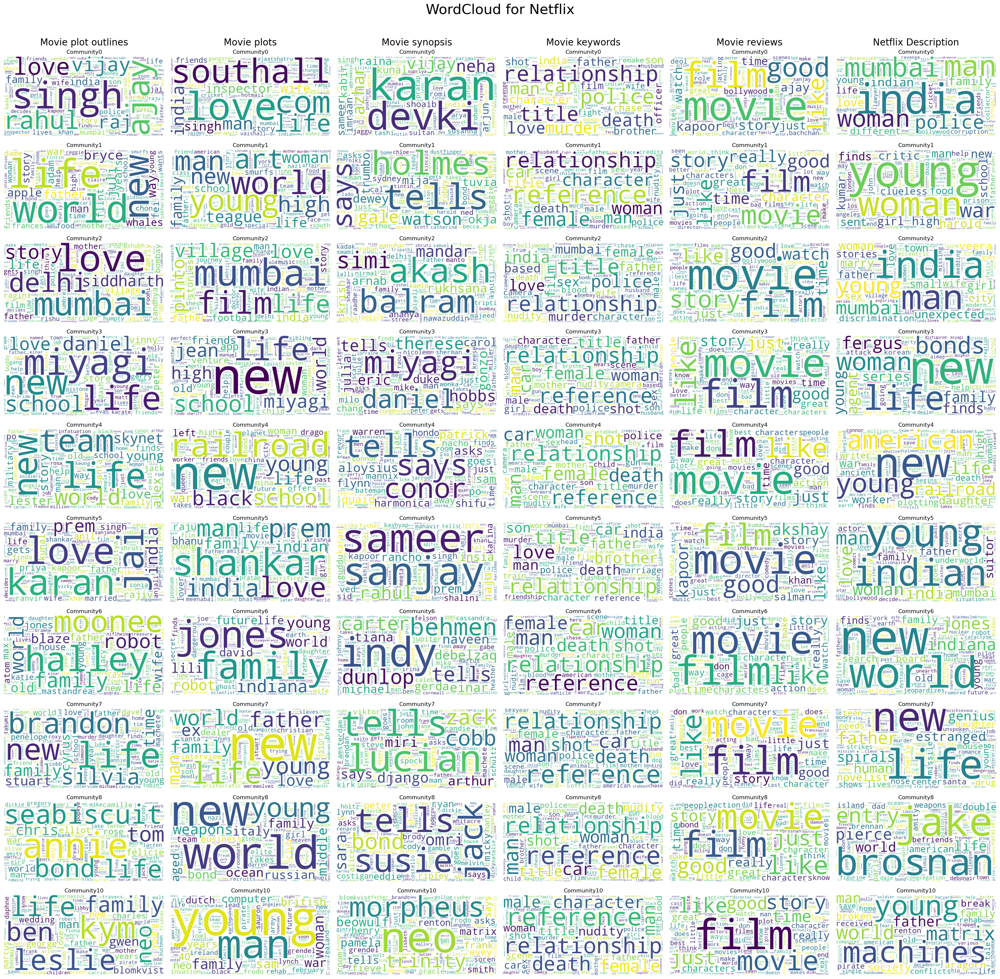

In [311]:
import matplotlib.pyplot as plt
limit = 10
names = np.array(Counter(gcc.vs['p0_clustering']).most_common(limit))[:, 0]
fig, axes = plt.subplots(limit, 6, figsize=(30, limit*3), dpi=100)
plt.suptitle('WordCloud for Netflix\n\n', size=30)
rows = [f"Community{i+1}" for i in range(limit)]
cols = ['Movie plot outlines', 'Movie plots', 'Movie synopsis', 'Movie keywords', 'Movie reviews', 'Netflix Description']
for ax, col in zip(axes[0], cols):
    ax.annotate(col, xy=(0.5, 1), xytext=(0, 20),
                xycoords='axes fraction', textcoords='offset points',
                size=20, ha='center', va='bottom', color='black')
for j in range(6):
    for i in range(limit):
        wc = wc_matrix[j][i]
        axes[i, j].imshow(wc)
        axes[i, j].set_axis_off()
        axes[i, j].set_title(f'Community{names[i]}')
plt.tight_layout()
plt.show()

### Attributes statistics for top communities

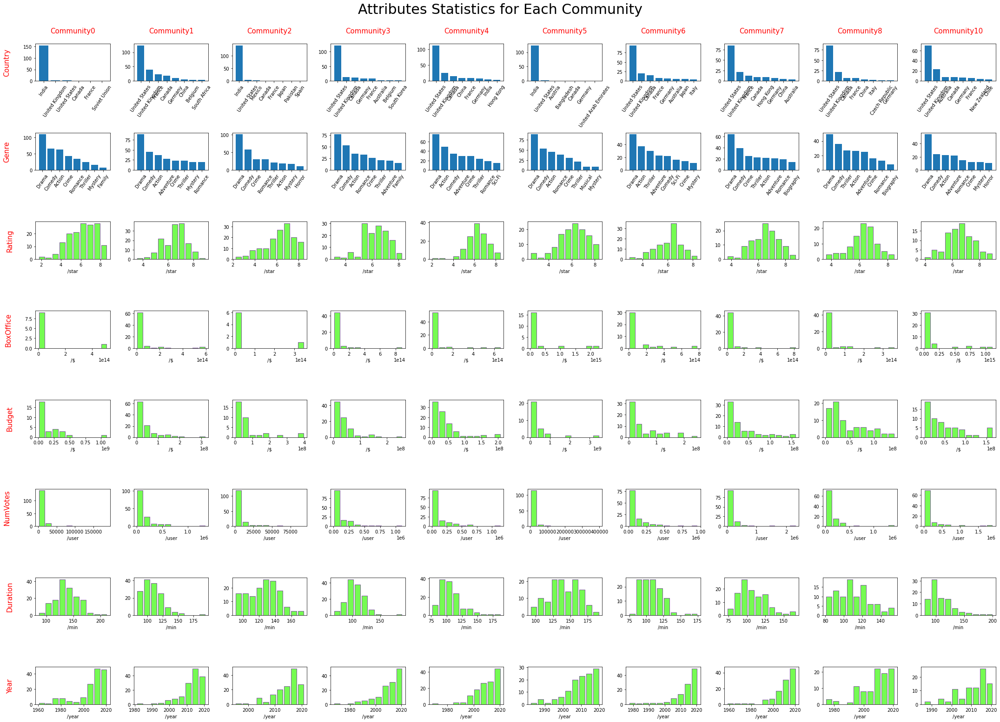

In [312]:
key = 'country'
limit = 10
names = np.array(Counter(gcc.vs['p0_clustering']).most_common(limit))[:, 0]
partition = p0
sub_graphs = sorted(partition.subgraphs(), key=lambda g: len(g.vs), reverse=True)[:limit]
fig, axes = plt.subplots(8, limit, figsize=(3*limit, 22))
plt.suptitle('Attributes Statistics for Each Community\n', size=30)
rows = ['Country', 'Genre', 'Rating', 'BoxOffice', 'Budget', 'NumVotes', 'Duration', 'Year']
cols = [f'Community{i}' for i in names]
axes = set_fig_info(fig, axes, rows, cols, direction='left')
x_label = ['/star', '/$', '/$', '/user', '/min', '/year']
for j, g in enumerate(sub_graphs):
    for i, key in enumerate(['country', 'genres']):
        noimal_list = np.hstack(g.vs[key])
        noimal_list = noimal_list[~pd.isna(noimal_list)]
        unique, counts = np.unique(noimal_list, return_counts=True)
        order = np.array(sorted(zip(unique, counts), key=lambda x:x[1], reverse=True))[:8]
        x = list(range(len(order)))
        axes[i, j].bar(x, order[:,1].astype('int'))
        axes[i, j].set_xticks(x, order[:,0], rotation=55)
    for i, key in enumerate(['averageRating', 'boxOffice', 'budget', 'numVotes', 'runtimeMinutes', 'startYear']):
        numerical_list = [i for i in g.vs[key] if not pd.isna(i)]
        axes[i+2, j].hist(numerical_list, rwidth=0.8, color='#75fb52', edgecolor='#7b549b')
        axes[i+2, j].set_xlabel(x_label[i])
plt.tight_layout()


There is no clear relation between the communities and movie attributes.

But we still found some interesting phonemon, for example, if a communities is dominated by Bollywood Movies(Hindu), there would be less movies from other country, which show inda movie market would be a relatively isolated market. On the contrary if a community is dominated by hollwoood movies there would be many other countries like Canada, UK, Australia, France, German incorporated with.

## Sentiment analysis

In [184]:
# Load labMT
hap_meter = Happy_Hedonometer(delta=1, path='Data_Set_S1.txt')
display(hap_meter.LabMT.head(5))

text_material = [outline, plot, synopsis, keyword, review, describe] 
haps = []
for text_series in text_material:
    haps.append(text_series.apply(hap_meter))

# write it to graph attribute
hap_keys = ['hap_outline', 'hap_plot', 'hap_synopsis', 'hap_keyword', 'hap_review', 'hap_describe']
hap_titles=['Movie plot outlines', 'Movie plots', 'Movie synopsis', 'Movie keywords', 'Movie reviews', 'Netflix Description']
for key, hap in zip(hap_keys, haps):
    add_numerical_attribute(gcc, hap, key)
    
haps_summary = pd.DataFrame(columns=hap_titles)
for i, hap in enumerate(haps):
    haps_summary.iloc[:, i] = hap.describe()
haps_summary

,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
0,laughter,1,8.50,0.9313,3600,--,--,1728
1,happiness,2,8.44,0.9723,1853,2458,--,1230
2,love,3,8.42,1.1082,25,317,328,23
3,happy,4,8.30,0.9949,65,1372,1313,375
4,laughed,5,8.26,1.1572,3334,3542,--,2332


,Movie plot outlines,Movie plots,Movie synopsis,Movie keywords,Movie reviews,Netflix Description
count,1628.000000,1918.000000,930.000000,1834.000000,1892.000000,1923.000000
mean,4.100989,4.222440,4.020640,4.367986,4.459886,4.098904
std,0.612063,0.869094,0.501581,0.986329,0.282609,0.814184
min,1.978065,1.100000,2.011618,0.740000,3.325590,1.571429
25%,3.671827,3.659118,3.689225,3.819650,4.283353,3.547560
50%,4.092577,4.226424,4.019557,4.176311,4.458642,4.084615
75%,4.537038,4.826429,4.343226,4.648746,4.632831,4.666857
max,6.156667,7.252000,7.710000,8.420000,6.053846,6.890000


1. missing values of different text categories aren't synchronized.
2. movie reviews are more tend to be negative, which fits with our hypothesis, Among user comments there are a lot of internet hates.

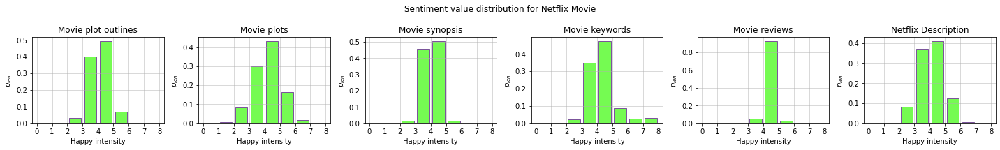

In [185]:
fig, axes = plt.subplots(1,6, figsize=(20, 3))
bins = range(9)

for ax, hap, title in zip(axes, haps, hap_titles):
    ax.set_title(f'{title}')
    ax.hist(hap.dropna(), bins, density=True, rwidth=0.8, color='#75fb52', edgecolor='#7b549b')
    ax.set_xlabel('Happy intensity')
    ax.set_ylabel('$p_{len}$')
    ax.grid(alpha=0.6)
    ax.set_xticks(bins)
plt.suptitle(f'Sentiment value distribution for Netflix Movie')
plt.tight_layout()
plt.show() 

### Sentiment for Countries and Genres

Top 10 most countries are  [('United States', 1108), ('India', 561), ('United Kingdom', 228), ('Canada', 126), ('France', 99), ('Germany', 73), ('China', 69), ('Hong Kong', 60), ('Spain', 54), ('Australia', 37)]


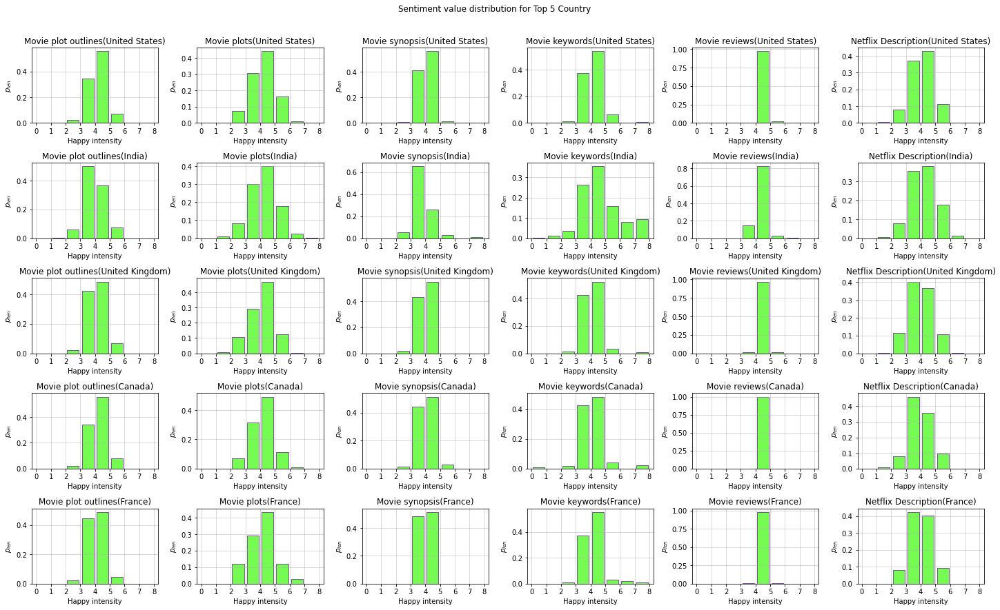

In [186]:
print('Top 10 most countries are ', 
      Counter(reduce(list_add, gcc.vs['country'])).most_common(10))
plot_hap_dist_for_attr(gcc, 'country', 5)

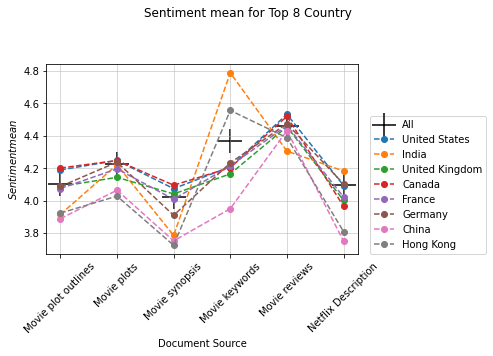

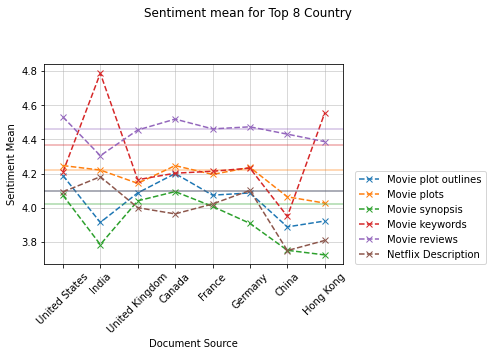

In [247]:
plot_mean_dist_for_attr_x(gcc, 'country', 8, haps_summary)
plot_mean_dist_for_attr_y(gcc, 'country', 8, haps_summary)

Top 10 most genres are  [('Drama', 1120), ('Comedy', 690), ('Action', 570), ('Crime', 391), ('Thriller', 344), ('Romance', 328), ('Adventure', 269), ('Mystery', 161), ('Horror', 138), ('Biography', 132)]


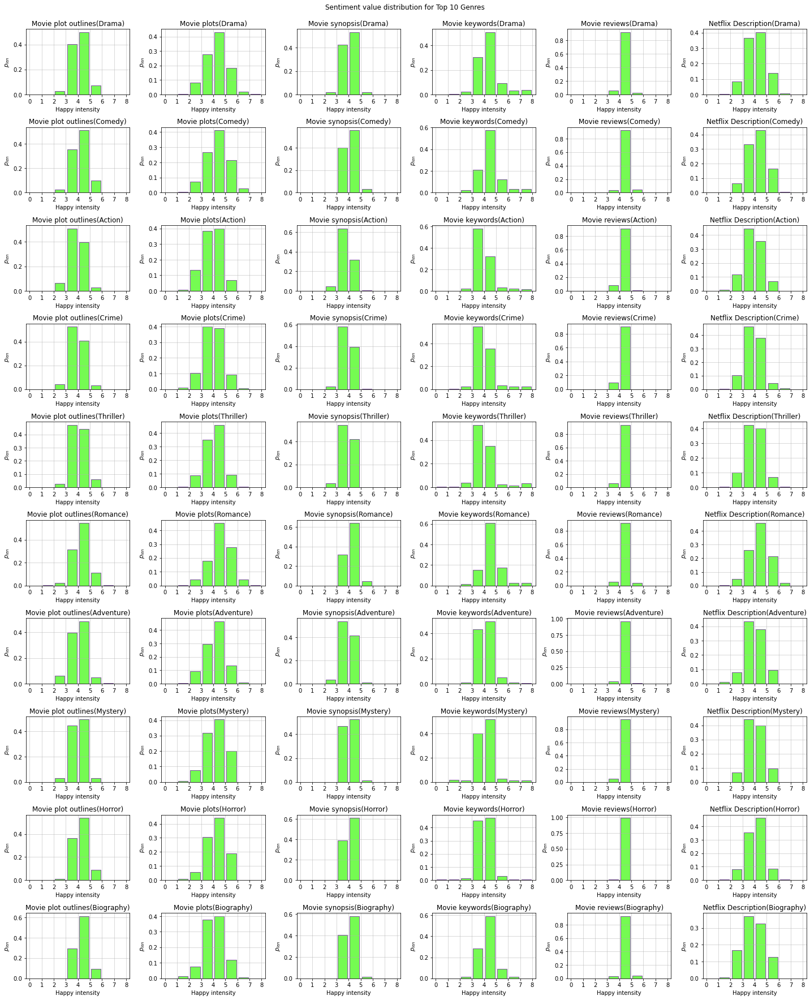

In [191]:
print('Top 10 most genres are ', 
      Counter(reduce(list_add, gcc.vs['genres'])).most_common(10))
plot_hap_dist_for_attr(gcc, 'genres', 10)

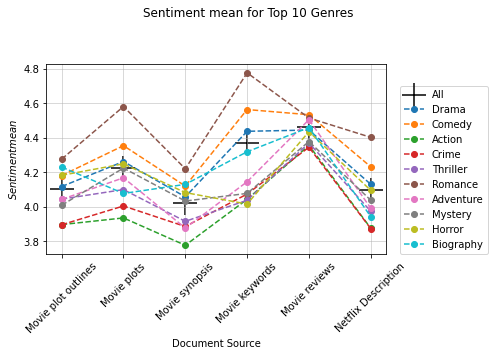

In [282]:
genres_means_dict = plot_mean_dist_for_attr_x(gcc, 'genres', 10, haps_summary)
# plot_mean_dist_for_attr_y(gcc, 'genres', 10, haps_summary)

#### Permutation Test

we found Romance movie always has a higher sentimental value than other movie.

Movie plot outlines           Movie plots            \
                        |Δ(mean)|   p-value   |Δ(mean)|   p-value   
United States           -0.088009  0.000999   -0.024863  0.231768   
France                  -0.026785  0.332667   -0.026835  0.388611   
China                    -0.21242  0.005994   -0.158102  0.064935   
India                   -0.186275  0.000999   -0.001372    0.4995   

              Movie synopsis           Movie keywords           Movie reviews  \
                   |Δ(mean)|   p-value      |Δ(mean)|   p-value     |Δ(mean)|   
United States      -0.053136  0.005994       -0.15946  0.000999      -0.07191   
France             -0.012411  0.431568      -0.153805   0.04995      -0.00212   
China              -0.268967  0.007992      -0.417791  0.000999     -0.028807   
India              -0.235373  0.000999       -0.41922  0.000999     -0.154817   

                        Netflix Description            
                p-value           |Δ(mean)|   p-value  
United States  0.000999           -0.005859   0.43956  
France         0.452547           -0.076295  0.180819  
China          0.182817           -0.348765  0.000999  
India          0.000999            -0.08323  0.016983

Movie plot outlines           Movie plots           Movie synopsis  \
                  |Δ(mean)|   p-value   |Δ(mean)|   p-value      |Δ(mean)|   
Romance           -0.175073  0.000999   -0.358978  0.000999      -0.199323   
Comedy            -0.079903  0.005994   -0.131889  0.000999      -0.099156   
Action            -0.205032  0.000999   -0.287711  0.000999      -0.244706   
Crime             -0.205822  0.000999   -0.218343  0.000999      -0.135655   

                  Movie keywords           Movie reviews            \
          p-value      |Δ(mean)|   p-value     |Δ(mean)|   p-value   
Romance  0.000999      -0.409134  0.000999     -0.054957  0.001998   
Comedy   0.001998      -0.195961  0.000999     -0.074126  0.000999   
Action   0.000999      -0.325202  0.000999     -0.103911  0.000999   
Crime    0.000999      -0.294547  0.000999     -0.114777  0.000999   

        Netflix Description            
                  |Δ(mean)|   p-value  
Romance           -0.303713  0.000999  
Comedy            -0.132746  0.000999  
Action            -0.223895  0.000999  
Crime             -0.226229  0.000999

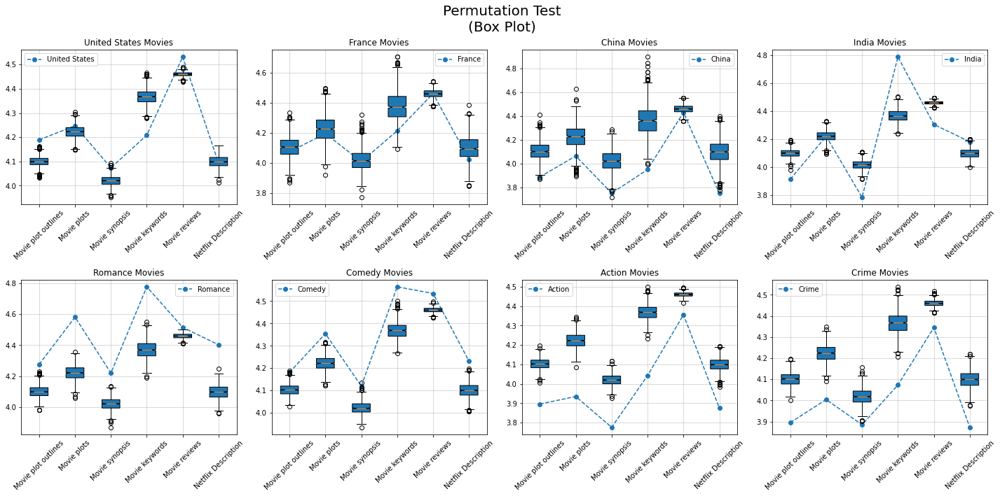

In [384]:
fig, axes = plt.subplots(2,4, figsize=(20, 10))
plt.suptitle('Permutation Test\n(Box Plot)', size=20)
columns = ['Movie plot outlines', 'Movie plots', 'Movie synopsis', 'Movie keywords', 'Movie reviews', 'Netflix Description']

countries = ['United States', 'France', 'China', 'India']
permutation_result = pd.DataFrame(index=countries, columns=pd.MultiIndex.from_product([columns, ['|Δ(mean)|', 'p-value']]))    
for ax, c in zip(axes[0], countries):
    ax, statistics = boxplot_for_perumtation(gcc, 'country', c, f'{c} Movies', 1000, ax)
    permutation_result.loc[c] = statistics
display(permutation_result)

genres = ['Romance', 'Comedy', 'Action', 'Crime']
permutation_result = pd.DataFrame(index=genres, columns=pd.MultiIndex.from_product([columns, ['|Δ(mean)|', 'p-value']]))    
for ax, r in zip(axes[1], genres):
    ax, statistics = boxplot_for_perumtation(gcc, 'genres', r, f'{r} Movies', 1000, ax)
    permutation_result.loc[r] = statistics
display(permutation_result)

plt.tight_layout()
plt.show() 

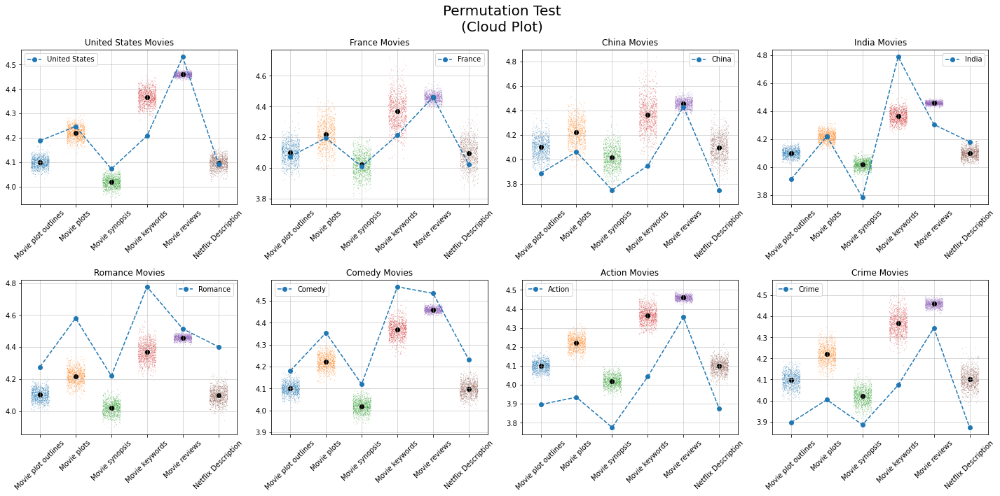

In [266]:
fig, axes = plt.subplots(2,4, figsize=(20, 10))
plt.suptitle('Permutation Test\n(Cloud Plot)', size=20)

countries = ['United States', 'France', 'China', 'India']
for ax, c in zip(axes[0], countries):
    ax = cloudplot_for_perumtation(gcc, 'country', c, f'{c} Movies', 1000, ax)
genres = ['Romance', 'Comedy', 'Action', 'Crime']
for ax, r in zip(axes[1], genres):
    ax = cloudplot_for_perumtation(gcc, 'genres', r, f'{r} Movies', 1000, ax)
plt.tight_layout()
plt.show() 
    

### Sentiment for Communities

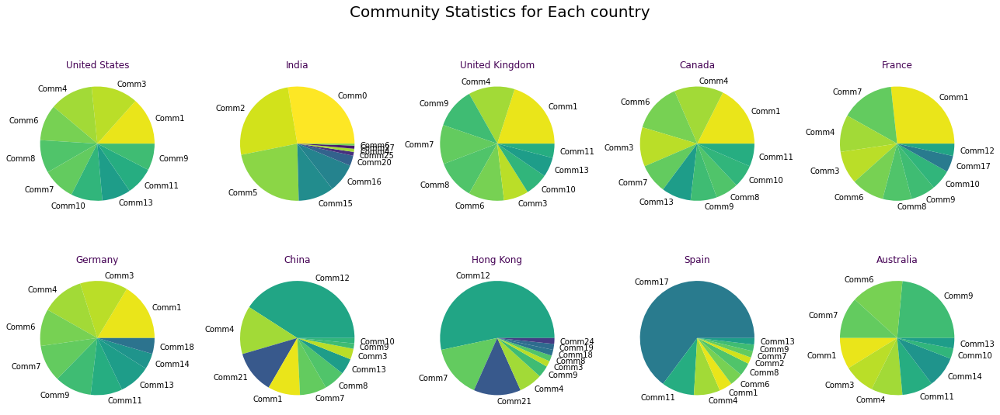

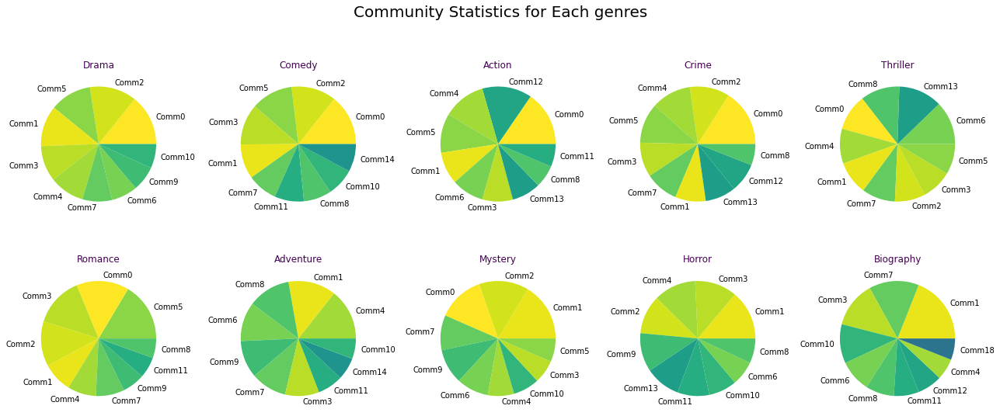

In [412]:
from SN_help import get_nominal
import matplotlib as mpl
cmap = mpl.colormaps['viridis']
colors = cmap(np.linspace(0,1, 30))[::-1]
limit = 10
partition = p0
part_key = 'p0_clustering'
attr_key = 'country'
g = gcc
member_list = np.array(g.vs[part_key])
attr_types = Counter(reduce(list_add, g.vs[attr_key])).most_common(limit)
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
plt.suptitle(f'Community Statistics for Each {attr_key}\n', size=20)
for i, (k, v) in enumerate(attr_types):
    assert len(member_list) == len(attr_list)
    attr_list = np.array(get_nominal(g, attr_key, k))
    member_of_attr = member_list[attr_list == 1]
    member_of_attr = member_of_attr[~pd.isna(member_of_attr)]
    unique, counts = np.unique(member_of_attr, return_counts=True)
    order = np.array(sorted(zip(unique, counts), key=lambda x:x[1], reverse=True))[:10]
    x = range(len(order))
    # axes[i//5, i%5].bar(x, order[:,1].astype('int'))
    # axes[i//5, i%5].set_xticks(x, [f'C{i}' for i in order[:,0]], rotation=55)
    axes[i//5, i%5].pie(order[:,1].astype('int'), labels=[f'Comm{i}' for i in order[:,0]], colors=colors[order[:,0]])
    axes[i//5, i%5].set_title(f'{k}', color=colors[-1])
plt.tight_layout()
plt.show()

limit = 10
partition = p0
part_key = 'p0_clustering'
attr_key = 'genres'
g = gcc
member_list = np.array(g.vs[part_key])
attr_types = Counter(reduce(list_add, g.vs[attr_key])).most_common(limit)
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
plt.suptitle(f'Community Statistics for Each {attr_key}\n', size=20)
for i, (k, v) in enumerate(attr_types):
    assert len(member_list) == len(attr_list)
    attr_list = np.array(get_nominal(g, attr_key, k))
    member_of_attr = member_list[attr_list == 1]
    member_of_attr = member_of_attr[~pd.isna(member_of_attr)]
    unique, counts = np.unique(member_of_attr, return_counts=True)
    order = np.array(sorted(zip(unique, counts), key=lambda x:x[1], reverse=True))[:10]
    x = range(len(order))
    axes[i//5, i%5].pie(order[:,1].astype('int'), labels=[f'Comm{i}' for i in order[:,0]], colors=colors[order[:,0]])
    # axes[i//5, i%5].bar(x, order[:,1].astype('int'))
    # axes[i//5, i%5].set_xticks(x, [f'C{i}' for i in order[:,0]], rotation=55)
    axes[i//5, i%5].set_title(f'{k}', color=colors[-1])
plt.tight_layout()
plt.show()

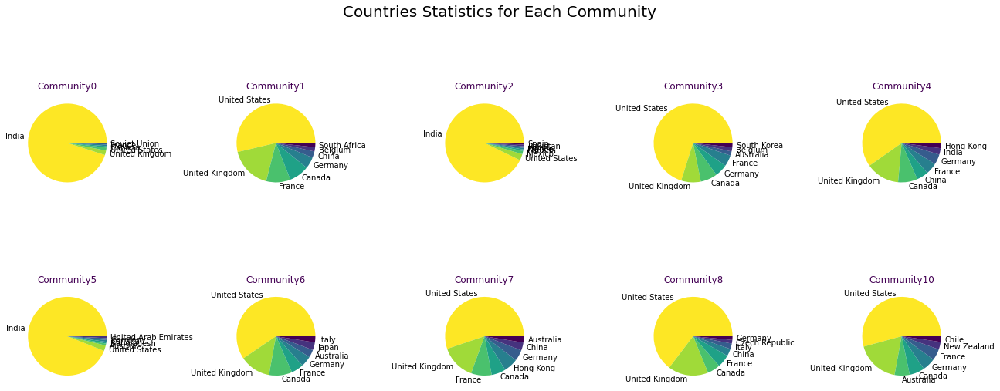

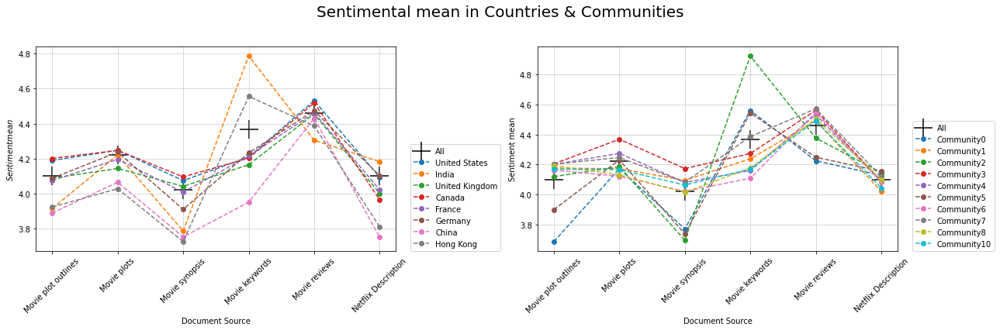

In [416]:
limit = 10
names = np.array(Counter(gcc.vs['p0_clustering']).most_common(limit))[:, 0]
partition = p0
colors = cmap(np.linspace(0,1, 8))[::-1]
sub_graphs = sorted(partition.subgraphs(), key=lambda g: len(g.vs), reverse=True)[:limit]
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
plt.suptitle('Countries Statistics for Each Community\n', size=20)
for i, g in enumerate(sub_graphs):
    country_list = np.hstack(g.vs['country'])
    country_list = country_list[~pd.isna(country_list)]
    unique, counts = np.unique(country_list, return_counts=True)
    order = np.array(sorted(zip(unique, counts), key=lambda x:x[1], reverse=True))[:8]
    x = range(len(order))
    axes[i//5, i%5].pie(order[:,1].astype('int'), labels=order[:,0], colors=colors)
    # axes[i//5, i%5].bar(x, order[:,1].astype('int'))
    # axes[i//5, i%5].set_xticks(x, order[:,0], rotation=55)
    axes[i//5, i%5].set_title(f'Community{names[i]}', color=colors[-1])
plt.tight_layout()
plt.show()

fig, (ax0, ax1) = plt.subplots(1,2, figsize=(18, 6))
plt.suptitle('Sentimental mean in Countries & Communities\n', size=20)
country_means_dict = plot_mean_dist_for_attr_x(gcc, 'country', 8, haps_summary, ax0)
community_means_dict = plot_mean_dist_for_community_x(gcc, 'p0_clustering', 10, haps_summary, ax1)
plt.tight_layout()
plt.show()

From visual inspection, we found the two figures above have a strong similarity, which inspire us that there maybe strong relationship between communities and countries.

Movie plot outlines  :  (0.0033538267129031908, 'Reject')
Movie plots          :  (0.6738619099149293, 'Accept')
Movie synopsis       :  (0.4558038714536099, 'Accept')
Movie keywords       :  (0.34249034581077664, 'Accept')
Movie reviews        :  (0.02084215732636828, 'Reject')
Netflix Description  :  (0.6623375965960496, 'Accept')


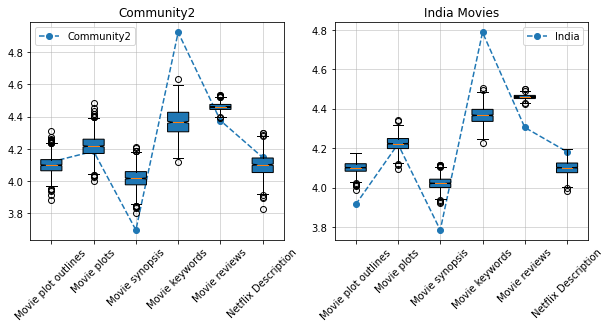

In [400]:
columns = ['Movie plot outlines', 'Movie plots', 'Movie synopsis', 'Movie keywords', 'Movie reviews', 'Netflix Description']
India_list = get_attr_hap(gcc, 'country', 'India')
Community2 = get_comm_hap(gcc, 'p0_clustering', 2)
for i in range(6):
    print(f'{columns[i]:<19}', ' : ',ttest_ind_fun(India_list[i], Community2[i]))

fig, (ax0, ax1) = plt.subplots(1,2, figsize=(10, 4))
boxplot_for_perumtation_community(gcc, 'p0_clustering', 2, 'Community2', 1000, ax0)
boxplot_for_perumtation(gcc, 'country', 'India', f'India Movies', 1000, ax1)
plt.show()


Corrcoef and Error between selected countries and communities regard same document type

In [319]:
corrcoef_df = pd.DataFrame(index=country_means_dict.keys(), columns=community_means_dict.keys())
for country, v in country_means_dict.items():
    for community, u in community_means_dict.items():
        corrcoef = np.corrcoef(v, u)[0,1]
        corrcoef_df.loc[country, community] = corrcoef
display(corrcoef_df)

for community, corrcoef0 in corrcoef_df.max(axis=0).iteritems():
    for country, corrcoef1 in corrcoef_df.max(axis=1).iteritems():
        if corrcoef0 == corrcoef1:
            print(community, ' ~ ',  country)

error_df = pd.DataFrame(index=country_means_dict.keys(), columns=community_means_dict.keys())
for country, v in country_means_dict.items():
    for community, u in community_means_dict.items():
        error = np.linalg.norm(np.subtract(u, v))
        error_df.loc[country, community] = error
display(error_df)

for community, error0 in error_df.min(axis=0).iteritems():
    for country, error1 in error_df.min(axis=1).iteritems():
        if error0 == error1:
            print(community, ' ~ ',  country)

,0,1,2,3,4,5,6,7,8,10
United States,0.352968,0.962266,0.385986,0.956125,0.988132,0.409952,0.962687,0.931166,0.96236,0.989019
India,0.963861,0.376044,0.963229,0.330797,0.218704,0.979713,0.205991,0.623972,0.330289,0.28621
United Kingdom,0.392866,0.986541,0.406882,0.956201,0.954945,0.413001,0.944066,0.950662,0.942961,0.986816
Canada,0.245556,0.970846,0.327818,0.969786,0.95204,0.30017,0.885898,0.891524,0.884734,0.961778
France,0.540232,0.957842,0.532016,0.958685,0.936407,0.56994,0.898192,0.97407,0.91554,0.952279
Germany,0.624982,0.851886,0.624624,0.867981,0.887919,0.697805,0.853478,0.933873,0.892352,0.875411
China,0.380073,0.947919,0.377092,0.981629,0.986792,0.427974,0.92777,0.918918,0.922619,0.969736
Hong Kong,0.807144,0.742608,0.913528,0.64948,0.54973,0.846029,0.536079,0.882518,0.64398,0.645032


5  ~  India
7  ~  France
10  ~  United States


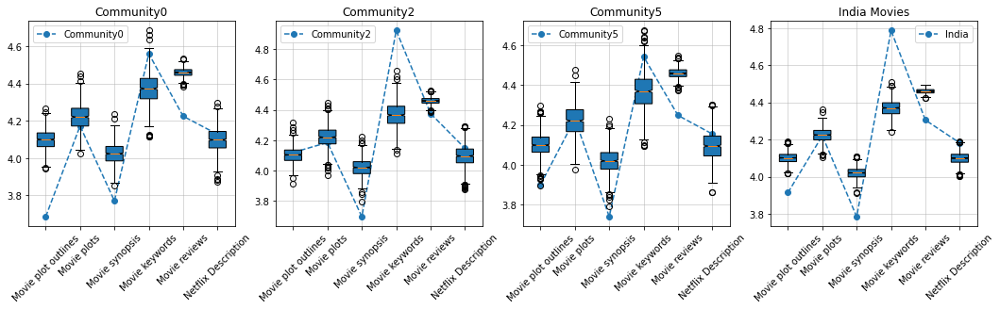

In [353]:
fig, (ax0, ax1, ax2, ax3) = plt.subplots(1,4, figsize=(18, 4))
boxplot_for_perumtation_community(gcc, 'p0_clustering', 0, 'Community0', 1000, ax0)
boxplot_for_perumtation_community(gcc, 'p0_clustering', 2, 'Community2', 1000, ax1)
boxplot_for_perumtation_community(gcc, 'p0_clustering', 5, 'Community5', 1000, ax2)
boxplot_for_perumtation(gcc, 'country', 'India', f'India Movies', 1000, ax3)
plt.show()

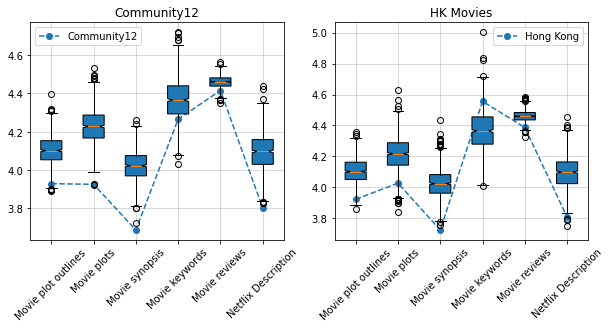

In [370]:
fig, (ax0, ax1) = plt.subplots(1,2, figsize=(10, 4))
boxplot_for_perumtation_community(gcc, 'p0_clustering', 12, 'Community12', 1000, ax0)
boxplot_for_perumtation(gcc, 'country', 'Hong Kong', f'HK Movies', 1000, ax1)
plt.show()

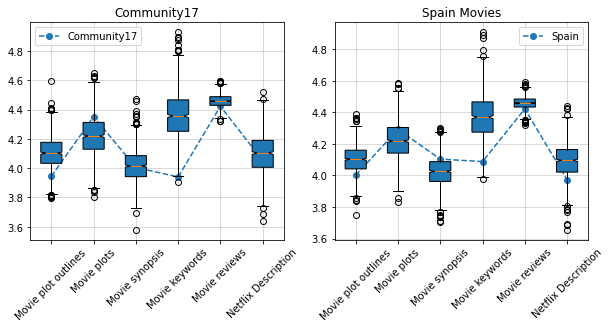

In [371]:
fig, (ax0, ax1) = plt.subplots(1,2, figsize=(10, 4))
boxplot_for_perumtation_community(gcc, 'p0_clustering', 17, 'Community17', 1000, ax0)
boxplot_for_perumtation(gcc, 'country', 'Spain', f'Spain Movies', 1000, ax1)
plt.show()

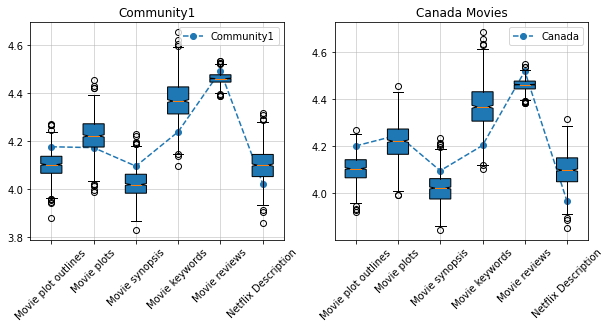

In [355]:
fig, (ax0, ax1) = plt.subplots(1,2, figsize=(10, 4))
boxplot_for_perumtation_community(gcc, 'p0_clustering', 1, 'Community1', 1000, ax0)
boxplot_for_perumtation(gcc, 'country', 'Canada', f'Canada Movies', 1000, ax1)
plt.show()

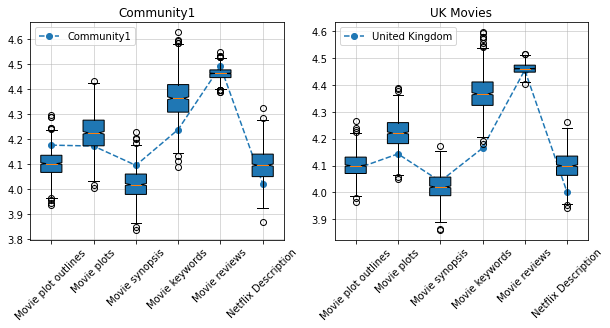

In [369]:
fig, (ax0, ax1) = plt.subplots(1,2, figsize=(10, 4))
boxplot_for_perumtation_community(gcc, 'p0_clustering', 1, 'Community1', 1000, ax0)
boxplot_for_perumtation(gcc, 'country', 'United Kingdom', f'UK Movies', 1000, ax1)
plt.show()